## Inport libraries

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from ucimlrepo import fetch_ucirepo 
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
import seaborn as sns

## Gather data, determine the method of data collection and provenance of the data (1 point)

In [43]:
# fetch dataset 
predict_students_dropout_and_academic_success = fetch_ucirepo(id=697) 
  
# data (as pandas dataframes) 
X = predict_students_dropout_and_academic_success.data.features 
y = predict_students_dropout_and_academic_success.data.targets 
  
# metadata 
print(predict_students_dropout_and_academic_success.metadata) 
  
# variable information 
print(predict_students_dropout_and_academic_success.variables) 

# train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123, stratify=y)

{'uci_id': 697, 'name': "Predict students' dropout and academic success", 'repository_url': 'https://archive.ics.uci.edu/dataset/697/predict+students+dropout+and+academic+success', 'data_url': 'https://archive.ics.uci.edu/static/public/697/data.csv', 'abstract': "A dataset created from a higher education institution (acquired from several disjoint databases) related to students enrolled in different undergraduate degrees, such as agronomy, design, education, nursing, journalism, management, social service, and technologies.\nThe dataset includes information known at the time of student enrollment (academic path, demographics, and social-economic factors) and the students' academic performance at the end of the first and second semesters. \nThe data is used to build classification models to predict students' dropout and academic sucess. The problem is formulated as a three category classification task, in which there is a strong imbalance towards one of the classes.", 'area': 'Other', '

## Identify a Supervised Machine Learning Problem (5 points)

The primary goal is to build classification models that can predict students' dropout and academic success in higher education. This is formulated as a three-category classification task.

## Exploratory Data Analysis (EDA) — Inspect, Visualize and Clean the Data (34 points)

### Data Overview

First, an overview of the explanatory variables.

In [4]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4424 entries, 0 to 4423
Data columns (total 36 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   Marital Status                                  4424 non-null   int64  
 1   Application mode                                4424 non-null   int64  
 2   Application order                               4424 non-null   int64  
 3   Course                                          4424 non-null   int64  
 4   Daytime/evening attendance                      4424 non-null   int64  
 5   Previous qualification                          4424 non-null   int64  
 6   Previous qualification (grade)                  4424 non-null   float64
 7   Nacionality                                     4424 non-null   int64  
 8   Mother's qualification                          4424 non-null   int64  
 9   Father's qualification                   

Full Output
```
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4424 entries, 0 to 4423
Data columns (total 36 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   Marital Status                                  4424 non-null   int64  
 1   Application mode                                4424 non-null   int64  
 2   Application order                               4424 non-null   int64  
 3   Course                                          4424 non-null   int64  
 4   Daytime/evening attendance                      4424 non-null   int64  
 5   Previous qualification                          4424 non-null   int64  
 6   Previous qualification (grade)                  4424 non-null   float64
 7   Nacionality                                     4424 non-null   int64  
 8   Mother's qualification                          4424 non-null   int64  
 9   Father's qualification                          4424 non-null   int64  
 10  Mother's occupation                             4424 non-null   int64  
 11  Father's occupation                             4424 non-null   int64  
 12  Admission grade                                 4424 non-null   float64
 13  Displaced                                       4424 non-null   int64  
 14  Educational special needs                       4424 non-null   int64  
 15  Debtor                                          4424 non-null   int64  
 16  Tuition fees up to date                         4424 non-null   int64  
 17  Gender                                          4424 non-null   int64  
 18  Scholarship holder                              4424 non-null   int64  
 19  Age at enrollment                               4424 non-null   int64  
 20  International                                   4424 non-null   int64  
 21  Curricular units 1st sem (credited)             4424 non-null   int64  
 22  Curricular units 1st sem (enrolled)             4424 non-null   int64  
 23  Curricular units 1st sem (evaluations)          4424 non-null   int64  
 24  Curricular units 1st sem (approved)             4424 non-null   int64  
 25  Curricular units 1st sem (grade)                4424 non-null   float64
 26  Curricular units 1st sem (without evaluations)  4424 non-null   int64  
 27  Curricular units 2nd sem (credited)             4424 non-null   int64  
 28  Curricular units 2nd sem (enrolled)             4424 non-null   int64  
 29  Curricular units 2nd sem (evaluations)          4424 non-null   int64  
 30  Curricular units 2nd sem (approved)             4424 non-null   int64  
 31  Curricular units 2nd sem (grade)                4424 non-null   float64
 32  Curricular units 2nd sem (without evaluations)  4424 non-null   int64  
 33  Unemployment rate                               4424 non-null   float64
 34  Inflation rate                                  4424 non-null   float64
 35  GDP                                             4424 non-null   float64
dtypes: float64(7), int64(29)
memory usage: 1.2 MB
```

In [5]:
X.describe()

,Marital Status,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Previous qualification (grade),Nacionality,Mother's qualification,Father's qualification,...,Curricular units 1st sem (without evaluations),Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP
count,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,...,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000
mean,1.178571,18.669078,1.727848,8856.642631,0.890823,4.577758,132.613314,1.873192,19.561935,22.275316,...,0.137658,0.541817,6.232143,8.063291,4.435805,10.230206,0.150316,11.566139,1.228029,0.001969
std,0.605747,17.484682,1.313793,2063.566416,0.311897,10.216592,13.188332,6.914514,15.603186,15.343108,...,0.690880,1.918546,2.195951,3.947951,3.014764,5.210808,0.753774,2.663850,1.382711,2.269935
min,1.000000,1.000000,0.000000,33.000000,0.000000,1.000000,95.000000,1.000000,1.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.600000,-0.800000,-4.060000
25%,1.000000,1.000000,1.000000,9085.000000,1.000000,1.000000,125.000000,1.000000,2.000000,3.000000,...,0.000000,0.000000,5.000000,6.000000,2.000000,10.750000,0.000000,9.400000,0.300000,-1.700000
50%,1.000000,17.000000,1.000000,9238.000000,1.000000,1.000000,133.100000,1.000000,19.000000,19.000000,...,0.000000,0.000000,6.000000,8.000000,5.000000,12.200000,0.000000,11.100000,1.400000,0.320000
75%,1.000000,39.000000,2.000000,9556.000000,1.000000,1.000000,140.000000,1.000000,37.000000,37.000000,...,0.000000,0.000000,7.000000,10.000000,6.000000,13.333333,0.000000,13.900000,2.600000,1.790000
max,6.000000,57.000000,9.000000,9991.000000,1.000000,43.000000,190.000000,109.000000,44.000000,44.000000,...,12.000000,19.000000,23.000000,33.000000,20.000000,18.571429,12.000000,16.200000,3.700000,3.510000


In [6]:
pd.set_option('display.max_columns', None)  # list all columns
X.head()

,Marital Status,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Previous qualification (grade),Nacionality,Mother's qualification,Father's qualification,Mother's occupation,Father's occupation,Admission grade,Displaced,Educational special needs,Debtor,Tuition fees up to date,Gender,Scholarship holder,Age at enrollment,International,Curricular units 1st sem (credited),Curricular units 1st sem (enrolled),Curricular units 1st sem (evaluations),Curricular units 1st sem (approved),Curricular units 1st sem (grade),Curricular units 1st sem (without evaluations),Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP
0,1,17,5,171,1,1,122.0,1,19,12,5,9,127.3,1,0,0,1,1,0,20,0,0,0,0,0,0.000000,0,0,0,0,0,0.000000,0,10.8,1.4,1.74
1,1,15,1,9254,1,1,160.0,1,1,3,3,3,142.5,1,0,0,0,1,0,19,0,0,6,6,6,14.000000,0,0,6,6,6,13.666667,0,13.9,-0.3,0.79
2,1,1,5,9070,1,1,122.0,1,37,37,9,9,124.8,1,0,0,0,1,0,19,0,0,6,0,0,0.000000,0,0,6,0,0,0.000000,0,10.8,1.4,1.74
3,1,17,2,9773,1,1,122.0,1,38,37,5,3,119.6,1,0,0,1,0,0,20,0,0,6,8,6,13.428571,0,0,6,10,5,12.400000,0,9.4,-0.8,-3.12
4,2,39,1,8014,0,1,100.0,1,37,38,9,9,141.5,0,0,0,1,0,0,45,0,0,6,9,5,12.333333,0,0,6,6,6,13.000000,0,13.9,-0.3,0.79


There are no missing values in the data, and it appears that categorical data has already been converted to dummy variables.

For more information on each variable, please see the variable table here: https://archive.ics.uci.edu/dataset/697/predict+students+dropout+and+academic+success

Also check the objective variable.

In [7]:
y.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4424 entries, 0 to 4423
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Target  4424 non-null   object
dtypes: object(1)
memory usage: 34.7+ KB


In [8]:
y.groupby('Target')['Target'].count()

Target
Dropout     1421
Enrolled     794
Graduate    2209
Name: Target, dtype: int64

There are no missing values in the objective variable either; it appears that the data will need to be modeled with caution due to the small number of Enrolled labels and the imbalance in the data.

### Data Visualization
To extract valid explanatory variables, calculate the mean value of each explanatory variable for each objective variable or display a paired plot

In [9]:
df_train = pd.concat([X_train, y_train], axis=1)

df_train.groupby('Target')[X.columns].mean()

,Marital Status,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Previous qualification (grade),Nacionality,Mother's qualification,Father's qualification,Mother's occupation,Father's occupation,Admission grade,Displaced,Educational special needs,Debtor,Tuition fees up to date,Gender,Scholarship holder,Age at enrollment,International,Curricular units 1st sem (credited),Curricular units 1st sem (enrolled),Curricular units 1st sem (evaluations),Curricular units 1st sem (approved),Curricular units 1st sem (grade),Curricular units 1st sem (without evaluations),Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP
Target,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Dropout,1.269129,23.770449,1.607740,8752.412489,0.852243,5.313984,131.012929,1.901495,20.919085,22.598945,10.085312,10.316623,124.902375,0.465259,0.014952,0.217238,0.682498,0.492524,0.090589,26.130167,0.020229,0.573439,5.782762,7.717678,2.518909,7.235778,0.199648,0.420405,5.754617,7.134565,1.918206,5.879060,0.252419,11.652243,1.256464,-0.162973
Enrolled,1.144882,19.234646,1.637795,8852.291339,0.908661,4.910236,131.173071,2.119685,17.804724,21.702362,14.592126,14.370079,125.665039,0.559055,0.015748,0.103937,0.952756,0.379528,0.170079,22.354331,0.028346,0.455118,5.932283,9.310236,4.281890,11.156002,0.173228,0.321260,5.911811,9.404724,4.042520,11.138009,0.174803,11.230079,1.207244,0.064283
Graduate,1.134126,14.890209,1.835880,8959.279570,0.909451,4.049236,134.218676,1.766836,19.254103,22.543294,9.900396,10.222411,128.915789,0.591964,0.010753,0.045274,0.986984,0.249576,0.372949,21.832484,0.024901,0.828523,6.659310,8.281268,6.235993,12.660891,0.095642,0.642898,6.617997,8.135257,6.184493,12.720237,0.077533,11.628636,1.187210,0.073390


In [30]:
sns.pairplot(df_train, hue='Target', vars=X.columns)

Looking at the distribution plots on the diagonal of the paired plots, all variables have different mean values and peak positions depending on the target class, which seems to be useful at some level for classification

## Perform Analysis Using Supervised Machine Learning Models of your Choice, Present Discussion and Conclusions (65 points)

### Initial Model Building with Random Forests
Using a robust random forest without data preprocessing, we first build a classification model with all features. Visualize the importance of both features to help feature extraction

In [10]:
# build random forest model
rf = RandomForestClassifier(n_estimators=100, random_state=123)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)
print('train_Accuracy', rf.score(X_train, y_train))
print('test_Accuracy: %.2f' % accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

/Users/kiro02/Library/Caches/pypoetry/virtualenvs/cub-2023oct-tIHWYxGD-py3.11/lib/python3.11/site-packages/sklearn/base.py:1152: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


train_Accuracy 1.0
test_Accuracy: 0.76
              precision    recall  f1-score   support

     Dropout       0.80      0.73      0.77       284
    Enrolled       0.54      0.39      0.45       159
    Graduate       0.79      0.92      0.85       442

    accuracy                           0.76       885
   macro avg       0.71      0.68      0.69       885
weighted avg       0.75      0.76      0.75       885

[[208  31  45]
 [ 37  62  60]
 [ 14  22 406]]


The Enrolled class is less accurate than the other classes due to the small number of data

In [11]:
# feature importance
importances = rf.feature_importances_
indices = np.argsort(importances)[::-1]
for f in range(X_train.shape[1]):
    print('%2d) %-*s %f' % (f + 1, 30, X.columns[indices[f]], importances[indices[f]]))

 1) Curricular units 2nd sem (approved) 0.149118
 2) Curricular units 1st sem (approved) 0.098823
 3) Curricular units 2nd sem (grade) 0.088541
 4) Curricular units 1st sem (grade) 0.069226
 5) Tuition fees up to date        0.043346
 6) Admission grade                0.043342
 7) Curricular units 2nd sem (evaluations) 0.041073
 8) Age at enrollment              0.037700
 9) Previous qualification (grade) 0.036833
10) Curricular units 1st sem (evaluations) 0.034746
11) Course                         0.031774
12) Father's occupation            0.028586
13) Mother's occupation            0.026534
14) GDP                            0.023078
15) Unemployment rate              0.022261
16) Father's qualification         0.021630
17) Inflation rate                 0.021468
18) Mother's qualification         0.021417
19) Application mode               0.021002
20) Curricular units 2nd sem (enrolled) 0.020506
21) Curricular units 1st sem (enrolled) 0.019803
22) Scholarship holder             0

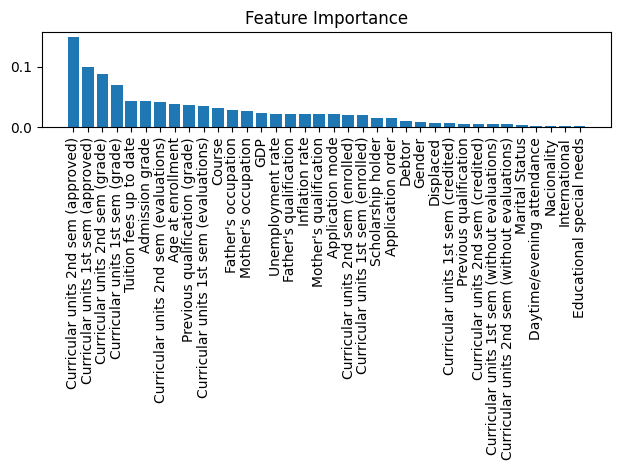

In [12]:
# plot feature importance   
plt.title('Feature Importance')
plt.bar(range(X_train.shape[1]), importances[indices], align='center')
plt.xticks(range(X_train.shape[1]), X.columns[indices], rotation=90)
plt.tight_layout()
plt.show()

In [13]:
top_10_features = X.columns[indices][:10]
print(top_10_features)

Index(['Curricular units 2nd sem (approved)',
       'Curricular units 1st sem (approved)',
       'Curricular units 2nd sem (grade)', 'Curricular units 1st sem (grade)',
       'Tuition fees up to date', 'Admission grade',
       'Curricular units 2nd sem (evaluations)', 'Age at enrollment',
       'Previous qualification (grade)',
       'Curricular units 1st sem (evaluations)'],
      dtype='object')


In [14]:
# build random forest model with top 10 features
rf = RandomForestClassifier(n_estimators=100, random_state=123)
rf.fit(X_train[top_10_features], y_train)
y_pred = rf.predict(X_test[top_10_features])
print('train_Accuracy', rf.score(X_train[top_10_features], y_train))
print('test_Accuracy: %.2f' % accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

/Users/kiro02/Library/Caches/pypoetry/virtualenvs/cub-2023oct-tIHWYxGD-py3.11/lib/python3.11/site-packages/sklearn/base.py:1152: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


train_Accuracy 1.0
test_Accuracy: 0.75
              precision    recall  f1-score   support

     Dropout       0.81      0.71      0.76       284
    Enrolled       0.49      0.38      0.43       159
    Graduate       0.79      0.91      0.84       442

    accuracy                           0.75       885
   macro avg       0.70      0.67      0.68       885
weighted avg       0.74      0.75      0.74       885

[[202  38  44]
 [ 33  61  65]
 [ 15  25 402]]


In [15]:
# build logistic regression model
lr = LogisticRegression(random_state=123)
# standardize data
sc = StandardScaler()
sc.fit(X_train)
X_train_std = sc.transform(X_train)
X_test_std = sc.transform(X_test)
lr.fit(X_train_std, y_train)
y_pred = lr.predict(X_test_std)
print('train_Accuracy', lr.score(X_train_std, y_train))
print('test_Accuracy: %.2f' % accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

/Users/kiro02/Library/Caches/pypoetry/virtualenvs/cub-2023oct-tIHWYxGD-py3.11/lib/python3.11/site-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


train_Accuracy 0.7770556654422153
test_Accuracy: 0.75
              precision    recall  f1-score   support

     Dropout       0.78      0.74      0.76       284
    Enrolled       0.47      0.35      0.40       159
    Graduate       0.81      0.91      0.85       442

    accuracy                           0.75       885
   macro avg       0.69      0.67      0.67       885
weighted avg       0.74      0.75      0.74       885

[[210  36  38]
 [ 44  56  59]
 [ 14  26 402]]


### Modeling with other algorithms

In [16]:
# build logistic regression model with top 10 features from random forest
lr = LogisticRegression(random_state=123)
lr.fit(X_train_std[:, indices][:, :10], y_train)
y_pred = lr.predict(X_test_std[:, indices][:, :10])
print('train_Accuracy', lr.score(X_train_std[:, indices][:, :10], y_train))
print('test_Accuracy: %.2f' % accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

train_Accuracy 0.7454083074314778
test_Accuracy: 0.72
              precision    recall  f1-score   support

     Dropout       0.75      0.70      0.73       284
    Enrolled       0.41      0.27      0.33       159
    Graduate       0.77      0.89      0.82       442

    accuracy                           0.72       885
   macro avg       0.64      0.62      0.63       885
weighted avg       0.70      0.72      0.70       885

[[200  41  43]
 [ 39  43  77]
 [ 27  21 394]]


/Users/kiro02/Library/Caches/pypoetry/virtualenvs/cub-2023oct-tIHWYxGD-py3.11/lib/python3.11/site-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [17]:
# build SVM model
svm = SVC(kernel='linear', C=1.0, random_state=123)
svm.fit(X_train_std, y_train)
y_pred = svm.predict(X_test_std)
print('train_Accuracy: %.2f' % svm.score(X_train_std, y_train))
print('test_Accuracy: %.2f' % accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

/Users/kiro02/Library/Caches/pypoetry/virtualenvs/cub-2023oct-tIHWYxGD-py3.11/lib/python3.11/site-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


train_Accuracy: 0.78
test_Accuracy: 0.75
              precision    recall  f1-score   support

     Dropout       0.80      0.72      0.76       284
    Enrolled       0.47      0.36      0.41       159
    Graduate       0.80      0.91      0.85       442

    accuracy                           0.75       885
   macro avg       0.69      0.66      0.67       885
weighted avg       0.74      0.75      0.74       885

[[204  40  40]
 [ 38  58  63]
 [ 14  26 402]]


In [18]:
# build SVM model with top 10 features from random forest
svm = SVC(kernel='linear', C=1.0, random_state=123)
svm.fit(X_train_std[:, indices][:, :10], y_train)
y_pred = svm.predict(X_test_std[:, indices][:, :10])
print('train_Accuracy: %.2f' % svm.score(X_train_std[:, indices][:, :10], y_train))
print('test_Accuracy: %.2f' % accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

/Users/kiro02/Library/Caches/pypoetry/virtualenvs/cub-2023oct-tIHWYxGD-py3.11/lib/python3.11/site-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


train_Accuracy: 0.75
test_Accuracy: 0.72
              precision    recall  f1-score   support

     Dropout       0.79      0.67      0.73       284
    Enrolled       0.41      0.33      0.37       159
    Graduate       0.76      0.89      0.82       442

    accuracy                           0.72       885
   macro avg       0.66      0.63      0.64       885
weighted avg       0.71      0.72      0.71       885

[[191  51  42]
 [ 26  53  80]
 [ 24  25 393]]


Random forests have 100% accuracy on training data and are over-trained compared to SVM and logistic regression

In [62]:
# hyperparameter tuning for SVM using opuna
import optuna
from sklearn.model_selection import cross_val_score

def objective(trial):
    C = trial.suggest_loguniform('C', 1e-5, 1e5)
    kernel = trial.suggest_categorical('kernel', ['linear', 'rbf'])
    svm = SVC(kernel=kernel, C=C, random_state=123)
    return cross_val_score(svm, X_train_std, y_train, n_jobs=-1, cv=5).mean()

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=100, timeout=600)
print(study.best_params)
print(study.best_value)
print(study.best_trial)

[I 2023-12-02 20:29:19,397] A new study created in memory with name: no-name-72dc943e-f0c2-48de-97b9-ad122de54f5d
/var/folders/_1/_y6lxkm177x0g8qp8xrnnxrh0000gn/T/ipykernel_7180/2809475640.py:6: FutureWarning: suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float(..., log=True) instead.
  C = trial.suggest_loguniform('C', 1e-5, 1e5)
/Users/kiro02/Library/Caches/pypoetry/virtualenvs/cub-2023oct-tIHWYxGD-py3.11/lib/python3.11/site-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/kiro02/Library/Caches/pypoetry/virtualenvs/cub-2023oct-tIHWYxGD-py3.11/lib/python3.11/site-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. 

{'C': 10614.009515400878, 'kernel': 'linear'}
0.7668824267414636
FrozenTrial(number=0, state=1, values=[0.7668824267414636], datetime_start=datetime.datetime(2023, 12, 2, 20, 29, 19, 398645), datetime_complete=datetime.datetime(2023, 12, 2, 20, 46, 26, 603301), params={'C': 10614.009515400878, 'kernel': 'linear'}, user_attrs={}, system_attrs={}, intermediate_values={}, distributions={'C': FloatDistribution(high=100000.0, log=True, low=1e-05, step=None), 'kernel': CategoricalDistribution(choices=('linear', 'rbf'))}, trial_id=0, value=None)


In [19]:
# print the best SVM model
svm = SVC(C=10614.009515400878, kernel='linear', random_state=123)
svm.fit(X_train_std, y_train)
y_pred = svm.predict(X_test_std)
print('train_Accuracy: %.2f' % svm.score(X_train_std, y_train))
print('test_Accuracy: %.2f' % accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

/Users/kiro02/Library/Caches/pypoetry/virtualenvs/cub-2023oct-tIHWYxGD-py3.11/lib/python3.11/site-packages/sklearn/utils/validation.py:1183: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


train_Accuracy: 0.78
test_Accuracy: 0.75
              precision    recall  f1-score   support

     Dropout       0.80      0.71      0.75       284
    Enrolled       0.46      0.37      0.41       159
    Graduate       0.80      0.91      0.85       442

    accuracy                           0.75       885
   macro avg       0.69      0.66      0.67       885
weighted avg       0.74      0.75      0.74       885

[[202  42  40]
 [ 37  59  63]
 [ 13  27 402]]


Accuracy did not change much...consider data augumentation to increase accuracy of Enrolled label predictions

## Data Augumentation

Resampling the data so that the number of data for each label is equal

In [22]:
df_train.groupby('Target')['Target'].count()

Target
Dropout     1137
Enrolled     635
Graduate    1767
Name: Target, dtype: int64

In [41]:
df_train_aug = pd.concat([
    df_train[df_train['Target'] == 'Graduate'],
    df_train[df_train['Target'] == 'Dropout'].sample(1767, replace=True),
    df_train[df_train['Target'] == 'Enrolled'].sample(1767, replace=True)
])

In [28]:
# build SVM model with augmented data with StandardScaler
svm = SVC(C=10, kernel='linear', random_state=123)
X_train_aug_std = sc.transform(df_train_aug[X.columns])
svm.fit(X_train_aug_std, df_train_aug['Target'])
y_pred = svm.predict(X_test_std)
print('train_Accuracy: %.2f' % svm.score(X_train_aug_std, df_train_aug['Target']))
print('test_Accuracy: %.2f' % accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))

train_Accuracy: 0.71
test_Accuracy: 0.73
              precision    recall  f1-score   support

     Dropout       0.85      0.67      0.75       284
    Enrolled       0.40      0.68      0.50       159
    Graduate       0.88      0.78      0.83       442

    accuracy                           0.73       885
   macro avg       0.71      0.71      0.69       885
weighted avg       0.78      0.73      0.74       885

[[189  76  19]
 [ 23 108  28]
 [ 10  86 346]]


cf.) Draft model of SVM

train_Accuracy: 0.78  
test_Accuracy: 0.75  

              precision    recall  f1-score   support

    Dropout       0.80      0.72      0.76       284
    Enrolled       0.47      0.36      0.41       159
    Graduate       0.80      0.91      0.85       442
    accuracy                           0.75       885
    macro avg      0.69      0.66      0.67       885  
    weighted avg   0.74      0.75      0.74       885  

[[204  40  40]  
 [ 38  58  63]  
 [ 14  26 402]]

 The overall Accuracy decreased slightly, but the predictive accuracy to the Enrolled label improved, indicating an improvement in the Macro Average F1 score.

## Use of more advanced ensemble models
Modeling with LightGBM and XGBoost

In [39]:
df_train_aug

,Marital Status,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Previous qualification (grade),Nacionality,Mother's qualification,Father's qualification,Mother's occupation,Father's occupation,Admission grade,Displaced,Educational special needs,Debtor,Tuition fees up to date,Gender,Scholarship holder,Age at enrollment,International,Curricular units 1st sem (credited),Curricular units 1st sem (enrolled),Curricular units 1st sem (evaluations),Curricular units 1st sem (approved),Curricular units 1st sem (grade),Curricular units 1st sem (without evaluations),Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
603,1,39,1,8014,0,1,120.0,1,1,1,4,4,150.5,0,0,0,1,0,0,27,0,0,6,6,6,12.500000,0,1,6,6,6,12.333333,0,15.5,2.8,-4.06,NaN
648,1,43,2,9556,1,1,120.0,1,1,19,4,3,110.2,0,0,0,1,0,0,27,0,0,7,9,7,12.228571,0,1,8,10,8,13.212500,0,10.8,1.4,1.74,NaN
4152,1,1,3,9085,1,1,140.0,1,10,19,90,90,135.8,1,0,0,1,0,0,18,0,0,5,6,5,13.333333,0,0,5,7,4,14.800000,0,7.6,2.6,0.32,NaN
1497,1,17,2,9670,1,1,110.0,1,1,1,4,10,115.3,1,0,0,1,1,0,19,0,0,6,8,6,13.857143,0,0,6,8,5,13.000000,0,15.5,2.8,-4.06,NaN
3140,1,39,1,9085,1,1,128.0,1,19,1,9,10,157.4,1,0,0,1,0,0,26,0,0,6,7,6,16.500000,0,0,6,8,6,14.285714,0,8.9,1.4,3.51,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3590,1,1,3,9147,1,1,124.0,1,1,1,5,3,116.7,1,0,0,1,1,0,19,0,0,5,6,0,0.000000,0,0,5,6,0,0.000000,0,7.6,2.6,0.32,NaN
1756,1,17,1,171,1,1,145.0,1,4,4,3,3,143.6,0,0,1,1,1,0,19,0,5,12,12,10,12.700000,0,4,11,16,10,12.272727,0,8.9,1.4,3.51,NaN
815,1,51,1,9147,1,1,130.0,1,1,1,4,4,120.0,0,0,0,1,0,0,21,0,0,5,9,5,12.800000,0,0,5,11,3,12.666667,0,11.1,0.6,2.02,NaN
765,1,1,4,9147,1,1,120.0,1,38,38,5,10,111.3,0,0,0,1,1,0,20,0,0,5,8,5,10.200000,0,0,5,7,5,11.200000,0,12.4,0.5,1.79,NaN


In [44]:
# encode target
df_train_aug['Target'] = df_train_aug['Target'].map({'Dropout': 0, 'Enrolled': 1, 'Graduate': 2})

y_test_enc = y_test['Target'].map({'Dropout': 0, 'Enrolled': 1, 'Graduate': 2})

In [45]:
# build LightGBM model with augmented data with StandardScaler
import lightgbm as lgb


lgb_train = lgb.Dataset(X_train_aug_std, df_train_aug['Target'])
lgb_eval = lgb.Dataset(X_test_std, y_test_enc, reference=lgb_train)

params = {
    'task': 'train',
    'boosting_type': 'gbdt',
    'objective': 'multiclass',
    'metric': {'multi_logloss'},
    'num_class': 3,
    'learning_rate': 0.1,
    'num_leaves': 31,
    'min_data_in_leaf': 1,
    'num_iteration': 100,
    'verbose': 0
}

gbm = lgb.train(params,
                lgb_train,
                num_boost_round=100,
                valid_sets=lgb_eval,
)
y_pred = gbm.predict(X_test_std, num_iteration=gbm.best_iteration)
y_pred = np.argmax(y_pred, axis=1)

/Users/kiro02/Library/Caches/pypoetry/virtualenvs/cub-2023oct-tIHWYxGD-py3.11/lib/python3.11/site-packages/lightgbm/engine.py:172: UserWarning: Found `num_iteration` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


In [46]:
print('train_Accuracy: %.2f' % accuracy_score(df_train_aug['Target'], np.argmax(gbm.predict(X_train_aug_std, num_iteration=gbm.best_iteration), axis=1)))
print('test_Accuracy: %.2f' % accuracy_score(y_test_enc, y_pred))
print(classification_report(y_test_enc, y_pred))
print(confusion_matrix(y_test_enc, y_pred))


train_Accuracy: 0.99
test_Accuracy: 0.75
              precision    recall  f1-score   support

           0       0.84      0.68      0.75       284
           1       0.46      0.52      0.49       159
           2       0.82      0.88      0.85       442

    accuracy                           0.75       885
   macro avg       0.70      0.69      0.69       885
weighted avg       0.76      0.75      0.75       885

[[193  56  35]
 [ 26  82  51]
 [ 12  41 389]]


In [ ]:
# Build XGBoost model with augmented data with StandardScaler
import xgboost as xgb

xgb_train = xgb.DMatrix(X_train_aug_std, label=df_train_aug['Target'])
xgb_eval = xgb.DMatrix(X_test_std, label=y_test_enc)

params = {
    'objective': 'multi:softmax',
    'num_class': 3,
    'eta': 0.1,
    'gamma': 0.1,
    'max_depth': 10
}

evals = [(xgb_train, 'train'), (xgb_eval, 'eval')]
bst = xgb.train(params, xgb_train, num_boost_round=100, evals=evals)

y_pred = bst.predict(xgb_eval)

In [55]:
print('train_Accuracy: %.2f' % accuracy_score(df_train_aug['Target'], bst.predict(xgb_train)))
print('test_Accuracy: %.2f' % accuracy_score(y_test_enc, y_pred))
print(classification_report(y_test_enc, y_pred))
print(confusion_matrix(y_test_enc, y_pred))

train_Accuracy: 1.00
test_Accuracy: 0.76
              precision    recall  f1-score   support

           0       0.81      0.69      0.74       284
           1       0.51      0.54      0.53       159
           2       0.83      0.90      0.86       442

    accuracy                           0.76       885
   macro avg       0.72      0.71      0.71       885
weighted avg       0.77      0.76      0.76       885

[[195  51  38]
 [ 30  86  43]
 [ 15  31 396]]


### Conclusion
 Overall, XGBoost performed best in the test data. However, the tree-based ensemble model, along with Random Forest and LightGBM, tended to overlearn.

1. **Training Accuracy**: The model achieved perfect accuracy (1.00 or 100%) on the training data. This indicates that it was able to correctly classify all training instances.

2. **Test Accuracy**: The accuracy on the test data is 0.76 (or 76%). This suggests that the model is reasonably effective but not as accurate on unseen data compared to the training data.

3. **Precision, Recall, and F1-Score by Class**:
    - **Class 0**: Precision is 0.81, indicating a high likelihood that instances predicted as class 0 are correctly classified. The recall is 0.69, meaning 69% of actual class 0 instances were correctly identified. The F1-score is 0.74, reflecting a balance between precision and recall.
    - **Class 1**: Precision is 0.51, which is moderate, indicating a 51% chance that class 1 predictions are correct. The recall is 0.54, showing that 54% of actual class 1 instances were identified. The F1-score is 0.53, indicating a moderate balance between precision and recall.
    - **Class 2**: Shows high precision (0.83) and recall (0.90), with an F1-score of 0.86, indicating strong performance in identifying and correctly classifying instances of this class.

4. **Overall Metrics**:
    - **Macro Average**: Averages computed across classes without weighting for class imbalance show values around 0.71 for precision, recall, and F1-score.
    - **Weighted Average**: Taking class imbalance into account, the averages are slightly higher, around 0.76 for all three metrics.

5. **Confusion Matrix**:
    - **Class 0**: 195 correctly identified, 51 misclassified as class 1, and 38 as class 2.
    - **Class 1**: 30 misclassified as class 0, 86 correctly identified, and 43 misclassified as class 2.
    - **Class 2**: 15 misclassified as class 0, 31 as class 1, and 396 correctly identified.

In summary, the XGBoost model shows excellent performance on the training data but its effectiveness decreases on the test data, particularly for class 1. The model is most effective in identifying class 2 instances. Precision, recall, and F1-score vary significantly across classes, indicating varying levels of performance and potential issues with class imbalance.